First of all, we load both the EFTBoss prior and posterior chains using GetDist. The prior chains are computed using the `prior.py` module: its operation and integration with GetDist are shown in the previous notebook, called `04_prior_computation.ipynb`.
 
In order to reproduce the results of [Consistency of effective field theory analyses of the BOSS power spectrum
](https://arxiv.org/abs/2208.05929) by *Simon et al*. we choose the set of parameters to be: $h$, $\omega_{cdm}$, $\ln{10^{10}A_s}$, $n_s$, $\Omega_m$, $\sigma_8$ and $S_8$.

In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

from getdist import loadMCSamples, plots, mcsamples, MCSamples

chain_dir = os.path.join(os.getcwd(), 'chains')

cosmo_prior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_cosmo_prior_', 
                          settings={'ignore_rows':0., 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
cosmo_prior.name_tag = 'BOSS Prior'
# Check completeness
print(f'List of \"cosmological\" parameters: {cosmo_prior.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {cosmo_prior.getParamNames().getDerivedNames()}')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8']


We compute $S_8$ using the following definition ([Cosmology Intertwined:
A Review of the Particle Physics, Astrophysics, and Cosmology
Associated with the Cosmological Tensions and Anomalies](https://arxiv.org/pdf/2203.06142v1.pdf), *Abdalla et al.*):

$$
S_8 = \sigma_8\sqrt{\Omega_m/0.3}
$$

In [2]:
# Add S8 as a derived parameter using GetDist
p = cosmo_prior.getParams()
cosmo_prior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

# Repeat the process for the posterior
posterior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_',
                          settings={'ignore_rows':0.3, 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
posterior.name_tag = 'BOSS'

p = posterior.getParams()
posterior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

from python_scripts.prior import * 
# Get parameters' fixed prior boundaries
prior = priorChain(filepath='chains/lcdm_eftboss/2023-10-12_10000_.paramnames', input_name='eftboss')

In [3]:
# Cosmological Parameters
cosmo_params = ['h', 'omega_cdm', 'ln10^{10}A_s', 'n_s', 'Omega_m', 'sigma8', 'S8']
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, cosmo_prior], cosmo_params, title_limit=1,
                filled=True, 
                param_limits=prior.get_param_limits());

Loading input file.
Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}


`priorChain().get_nuisance_prior()` scans the input `.param` file and finds the EFT nuisance parameters' names (so that we can also take a look at their posterior distributions). It then computes their prior distributions in the same way as the 'cosmological' parameters.\
\
As explained in [Limits on $\omega$-CDM from the EFTofLSS with the PyBird code](https://arxiv.org/abs/2003.07956v2) by D'Amico et al., the only varying EFT parameters are $b_1$ and $c_2$: the others, appearing only linearly in the power spectrum, are marginalized over at the level of the likelihood; the authors showed that even with this marginalization one can recover EFT parameters' best fit values with good accuracy.\
It is possible to get their posterior distributions using PyBird's `Likelihood()` class.

In [4]:
# Nuisance Parameters (varying)
nuisance_prior = prior.get_nuisance_prior(config_name='boss_pk_wc', ignore_rows=0.)
nuisance_prior.name_tag = 'Nuisance Prior'
nuisance_names = prior.nuisance_names

Removed no burn in


In [5]:
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, nuisance_prior], nuisance_names, title_limit=1,
                filled=True,
                param_limits=prior.get_param_limits());

Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}


#### Effective Parameters
We now try to understand how many parameters are better constrained by the data and not only by the prior. Recall that if each parameter's prior covariance is much wider than the data covariance we should get $N_{eff} \simeq N$ (none of the parameters is constrained by the prior): this follows from equation $(29)$ of [Concordance and Discordance in Cosmology](https://arxiv.org/abs/1806.04649) by Raveri et al.:
$$N_{eff} = N - tr{\left[ \mathcal{C}_\Pi^{-1}\mathcal{C}_p \right]}$$
This relation relies on the fact that the posterior covariance is a combination of the prior and the data covariance: $\mathcal{C}_p^{-1} = \mathcal{C}_\Pi^{-1} + \mathcal{C}^{-1}$ - under Gaussian approximation. A parameter is effectively constrained (or *measured*) when  $\mathcal{C}^{-1}\mathcal{C}_p \approx \mathbb{I}$, meaning that the prior information is irrelevant.\
\
The first equation tells us how many parameters the data set is measuring. Notice that one important property is that this quantity is reparametrization invariant so it does not really depend on the specific parameters that we are using: that is why we have seamlessly added the $S_8$ parameter.

In [6]:
from tensiometer import utilities
from tensiometer import gaussian_tension

# Re-definition of cosmo_params to match the Tensiometer example
cosmo_params = ['h', 'omega_cdm', 'n_s', 'ln10^{10}A_s', 'Omega_m', 'sigma8']
cosmo_labels = ['h', '\omega_{cdm}', 'n_s', '\ln{10^{10}A_s}', '\Omega_m', '\sigma_8']

print('N_eff = ', gaussian_tension.get_Neff(posterior, prior_chain=cosmo_prior, param_names=cosmo_params))

2023-11-03 12:47:01.862648: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-03 12:47:02.378488: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-03 12:47:02.378545: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-03 12:47:02.381884: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-03 12:47:02.677893: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-03 12:47:02.681073: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

N_eff =  4.37759806706756


In [7]:
# Checkpoint: run this cell to refresh the chains
prior_chain = cosmo_prior.copy()
posterior_chain = posterior.copy()

In [8]:
# Take the logarithm of the parameters: KL decomposition -> power-law decomposition
cosmo_log_params = []
cosmo_log_labels = []
for name, label in zip(cosmo_params, cosmo_labels):
    for chain in [prior_chain, posterior_chain]:
        p = chain.getParams()
        method = getattr(p, name)
        chain.addDerived(np.log(method), name='log_'+name, label='\\log '+label)
    cosmo_log_params += ['log_'+name]
    cosmo_log_labels += ['\\log '+label]

print('N_eff = ', gaussian_tension.get_Neff(posterior_chain, prior_chain=prior_chain, param_names=cosmo_log_params))

N_eff =  4.0021382901837805


We now perform *Posterior CPCA* as discussed in [What does a cosmological experiment really measure? Covariant posterior decomposition with normalizing flows](https://arxiv.org/abs/2112.05737) by Raveri et al., which amounts in computing the KL decomposition of posterior and data Fisher matrices, equivalent to solving the generalized problem:

$$
\mathcal{F} \equiv \mathcal{C}^{-1} \rightarrow \mathcal{F}_p\Psi = \mathcal{F}_\Pi\Psi\Lambda
$$
where $\Psi$ are the KL modes and $\Lambda$ is a diagonal matrix.\
Larger the eigenvalue $\lambda_i$ (associated to a KL mode), larger the improvement of the posterior over the prior. Here we multiply $\mathcal{C}_\Pi$ by the KL modes and diagonalize the resulting matrix: the eigenvalues are associated to each mode's direction and, by projection, we can derive the corresponding parameter's improvement factor. We can also compute this improvement in *error units*, defined as $\sqrt{\lambda_i-1}$.\
The modes are, therefore, the directions on the parameter space that contribute the most to the error improvement (of the posterior over the prior).

In [9]:
# Compute the KL modes excluding S8 due to outlier fraction
KL_param_names = cosmo_log_params
KL_eig, KL_eigv, KL_param_names = gaussian_tension.Q_UDM_KL_components(prior_chain, posterior_chain, 
                                                                    param_names=KL_param_names)

with np.printoptions(precision=2, suppress=True):
    if any(eig < 1. for eig in KL_eig):
        print('Improvement factor over the prior:', KL_eig)
        print('Discarding error units due to negative values.')
    else:
        print('Improvement factor over the prior in E.U.:', np.sqrt(KL_eig-1))

Improvement factor over the prior: [53.47 15.51  9.25  5.19  1.63  0.81]
Discarding error units due to negative values.


Now we decompose the parameter's posterior Fisher matrix over the KL components to project these modes over parameter directions.

Each cell tells us how much each KL mode contributes to the associated parameter's error bar (not marginalized). 

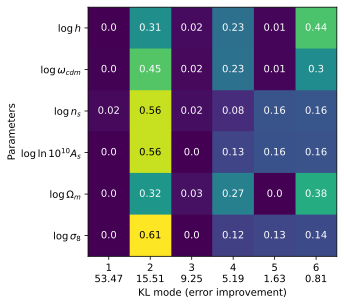

In [10]:
# Compute the fractional Fisher matrix
KL_param_names, KL_eig, fractional_fisher, _ = gaussian_tension.Q_UDM_fisher_components(prior_chain, posterior_chain, 
                                                                                        KL_param_names, 
                                                                                        which='1')
# Plot (showing values and names)
plt.figure(figsize=(4.5,4.5))
im1 = plt.imshow(fractional_fisher, cmap='viridis')
num_params = len(fractional_fisher)
# The following loop is used to display the fractional fisher values inside the cells
for i in range(num_params):
    for j in range(num_params):
        if fractional_fisher[j,i]>0.5:
            col = 'k'
        else:
            col = 'w'
        plt.text(i, j, np.round(fractional_fisher[j,i],2), va='center', ha='center', color=col)
plt.xlabel('KL mode (error improvement)');
plt.ylabel('Parameters');
ticks  = np.arange(num_params)
if any(eig < 1. for eig in KL_eig):
    labels = [str(t+1)+'\n'+str(l) for t,l in zip(ticks, np.round(KL_eig, 2))]
else:
    labels = [str(t+1)+'\n'+str(l) for t,l in zip(ticks, np.round(np.sqrt(KL_eig-1), 2))]
plt.xticks(ticks, labels, horizontalalignment='center');
labels = ['$'+posterior_chain.getParamNames().parWithName(name).label+'$' for name in KL_param_names]
plt.yticks(ticks, labels, horizontalalignment='right');

Now we project the posterior distributions on the KL modes. Notice that the better-constrained parameters show a fairly Gaussian distribution, while non-Gaussianities arise when the data-over-prior improvement degrades. 

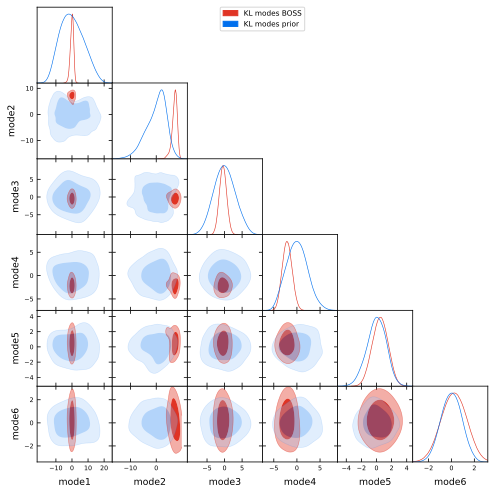

In [11]:
# List of indexes associated to each parameter
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
temp_names = ['mode'+str(i+1) for i in range(len(KL_param_names))]
# Projection on the KL modes
KL_filtered_samples = np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv)
# Building the chains using the same loglikes and weights of the original distributions
KL_chain = MCSamples(samples=KL_filtered_samples, 
                    loglikes=posterior_chain.loglikes, 
                    weights=posterior_chain.weights, 
                    names=temp_names, 
                    label='KL modes BOSS')
# Repeat for the prior
idx = [prior_chain.index[name] for name in KL_param_names]
KL_filtered_prior_samples = np.dot(prior_chain.samples[:,idx]-prior_mean, KL_eigv)
KL_prior_chain = MCSamples(samples=KL_filtered_prior_samples, 
                        loglikes=prior_chain.loglikes, 
                        weights=prior_chain.weights, 
                        names=temp_names, 
                        label='KL modes prior')
g = plots.get_subplot_plotter(width_inch=7)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([KL_chain, KL_prior_chain], params=temp_names, filled=True)

In the following cell Tensiometer performs the KL analysis of two given chains: in our case, we need to identify the directions that the posterior chain improves over the prior (best-constrained directions). A brief note on the `gaussian_tension.KL_PCA()` function:
1. `num_modes=4`: given by the total number of constrained parameters, computed previously,
2. `param_map='L'`: logarithmic transformation applied to parameter values (default),
3. `localize=True`: estimating the prior covariance around the posterior,
4. `dimensional_threshold=0.15`: parameters with a contribution less than $15\%$ of each KL mode's variance are neglected.

In [12]:
print(gaussian_tension.KL_PCA(prior_chain, posterior_chain, cosmo_params, num_modes=4,
                              localize=True, verbose=False, dimensional_threshold=0.15)[0])

KLCA for 6 parameters:

KL amplitudes - 1 (covariance/variance improvement per mode)
KLC 1:  39.3177 (   627.0 %)
KLC 2:   8.3726 (   289.4 %)
KLC 3:   6.5741 (   256.4 %)
KLC 4:   4.0806 (   202.0 %)

Parameter contribution to KL-mode variance
 mode number :       1       2       3       4
       log_h :   0.028   0.103   0.026   0.280
log_omega_cdm :   0.519   0.289   0.261   0.444
     log_n_s :   0.012   0.108   0.080   0.049
log_ln10^{10}A_s :   0.000   0.094   0.197   0.045
 log_Omega_m :   0.275   0.273   0.187   0.034
  log_sigma8 :   0.165   0.132   0.250   0.148

KL Principal Components
KLC 1:  39.3177 (   627.0 %)
(\omega{}_{cdm }/0.121733)^{1.000000}
(\Omega{}_{m }/0.310956)^{-0.573348}
(\sigma_8/0.760836)^{-0.492609}
          = 1.000000 +- 0.191846

KLC 2:   8.3726 (   289.4 %)
(\omega{}_{cdm }/0.121733)^{1.000000}
(\Omega{}_{m }/0.310956)^{-0.629684}
          = 1.000000 +- 0.153177

KLC 3:   6.5741 (   256.4 %)
(\omega{}_{cdm }/0.121733)^{1.000000}
(ln10^{10}A_{s }/2.92

The following are approximately the modes that are significantly improved over the prior (discarded numerical factors): we should therefore expect to see posterior distributions that are tighter than the prior distributions.

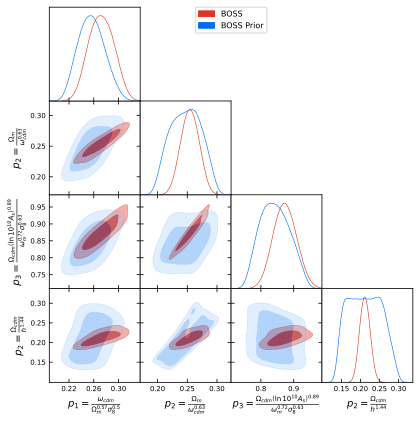

In [13]:
temp_posterior_chain = posterior_chain.copy()
temp_prior_chain = prior_chain.copy()
p_post = temp_posterior_chain.getParams()
p_prior = temp_prior_chain.getParams() 
temp_posterior_chain.addDerived(p_post.omega_cdm*(p_post.Omega_m**(-0.57))*(p_post.sigma8**(-0.5)), 
                      name='p1', label='p_1 = \\frac{\omega_{cdm}}{\Omega_m^{0.57} \sigma_8^{0.5}}');
temp_posterior_chain.addDerived(p_post.omega_cdm*(p_post.Omega_m**(-0.63)), 
                      name='p2', label='p_2 = \\frac{\Omega_m}{\omega_{cdm}^{0.63}}');
A_s = getattr(p_post, 'ln10^{10}A_s')
temp_posterior_chain.addDerived(p_post.omega_cdm*(p_post.Omega_m**(-0.72))*(A_s**(0.89))*(p_post.sigma8**(-0.63)), 
                      name='p3', label='p_3 = \\frac{\Omega_{cdm} \\left(\\ln{10^{10}A_s}\\right)^{0.89}}{\omega_{m}^{0.72} \sigma_8^{0.63}}');
temp_posterior_chain.addDerived((p_post.h**(-1.44))*p_post.omega_cdm, 
                      name='p4', label='p_2 = \\frac{\Omega_{cdm}}{h^{1.44}}');

temp_prior_chain.addDerived(p_prior.omega_cdm*(p_prior.Omega_m**(-0.57))*(p_prior.sigma8**(-0.5)), 
                      name='p1', label='p_1 = \\frac{\omega_{cdm}}{\Omega_m^{0.57} \sigma_8^{0.5}}');
temp_prior_chain.addDerived(p_prior.omega_cdm*(p_prior.Omega_m**(-0.63)), 
                      name='p2', label='p_2 = \\frac{\Omega_m}{\omega_{cdm}^{0.63}}');
A_s = getattr(p_prior, 'ln10^{10}A_s')
temp_prior_chain.addDerived(p_prior.omega_cdm*(p_prior.Omega_m**(-0.72))*(A_s**(0.89))*(p_prior.sigma8**(-0.63)), 
                      name='p3', label='p_3 = \\frac{\Omega_{cdm} \\left(\\ln{10^{10}A_s}\\right)^{0.89}}{\omega_{m}^{0.72} \sigma_8^{0.63}}');
temp_prior_chain.addDerived((p_prior.h**(-1.44))*p_prior.omega_cdm, 
                      name='p4', label='p_4 = \\frac{\Omega_{cdm}}{h^{1.44}}');

g = plots.get_subplot_plotter(width_inch=6)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([temp_posterior_chain, temp_prior_chain], params=['p1', 'p2', 'p3', 'p4'], filled=True)

We know that there are 2 main effects that can arise from the choice of priors: Simon et al. investigate these effects in [Consistency of effective field theory analyses of the BOSS power spectrum](https://arxiv.org/abs/2208.05929) in the context of EFT parameters. The authors refer to:
1. *Prior weight effect*: shift of the most-likely value of the parameter $\Omega$ due to the prior weighting in the likelihood, given that the true value of the EFT parameter $c$ will be different from the central value of the prior.
2. *Prior volume projection effect*: we know that EFT parameters are marginalized over in order to obtain constraints on the cosmological parameters. The volume projection effect refers to the marginalization integral over the EFT parameter $c$ given its prior. In the case of a Gaussian prior, we can compute the posterior marginalized over $c$ as:

$$
p\left(\Omega|c,data\right) = \int{dc \cdot \mathcal{e}^{-\frac{1}{2}\left( \left( c - \hat{c} \right)/\sigma \right)^2} \mathcal{L}\left(data|\Omega\right)}
$$
Since the likelihood depends on both $\Omega$ and $c$, that could enter the model not only linearly (e.g., $\Omega \times c$), the posterior $p\left(\Omega|c,data\right)$ will be non-Gaussian. The effect is a shift of the mean of $\Omega$ from its most-likely value.

We can (try to) remove the second effect in 2 ways: 
#### Prior Shrinking
This method aims to set each parameter's prior distribution to $0$ (no prior scenario). This can be achieved in the following way: we remove the prior mean from each sample, transform it to KL space, go back to parameter space leaving out the least-constrained modes, then add back the prior mean.\
This way we should get rid of the prior excess information.

In [14]:
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
inv_KL_eigv[3:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean
KL_filtered_samples = np.exp(KL_filtered_samples)

In [15]:
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=cosmo_params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(cosmo_params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
# The titles refer to the mean values of the KL posterior distributions
g.triangle_plot([KL_chain, posterior_chain], params=cosmo_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in cosmo_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in cosmo_params])
# Display mean indicators
for i in range(len(cosmo_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

We observe that every parameter constraint is tighter with respect to the non-projected one: we have effectively fixed prior-constrained directions.\
We also notice that the KL posterior of $\Omega_m$ seems to be fairly similar to the original posterior, meaning that, on this parameter, the prior distribution's volume projection effect is not as strong as it is on other parameters (e.g., $h$ or $\ln{10^{10}A_s}$).

#### Prior Explosion
This procedure is very similar to the previous one, except for the fact that we want to send the prior value to infinity. In a fully-Gaussian scenario the results should not differ very much from the previous experiment; however, in our realistic case where we have strong non-gaussianities in the parameters' distributions, the prior *explosion* is dominated by these non-gaussianities.\
To mitigate this effect we do not remove the prior on data-constrained directions but only on prior-constrained ones.

In [16]:
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Invert the values then send them to 0: this is equivalent to set them to infinity
KL_eig_inv = 1./KL_eig
KL_eig_inv[:3] = 0.
KL_filtered_samples = np.dot(np.dot(np.diag(1./(1.-KL_eig_inv)), 
                                    np.dot(KL_eigv.T, (posterior_chain.samples[:,idx]).T)).T-np.dot(np.diag(1./(1.-KL_eig_inv)*KL_eig_inv), 
                                                                                          np.dot(KL_eigv.T, prior_mean)), 
                                    inv_KL_eigv)

KL_filtered_samples = np.exp(KL_filtered_samples)
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=cosmo_params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(cosmo_params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})

In [17]:
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
# The titles refer to the mean values of the KL posterior distributions
g.triangle_plot([posterior_chain, KL_chain], params=cosmo_params, filled=True, title_limit=1);
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in cosmo_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in cosmo_params])
# Display mean indicators
for i in range(len(cosmo_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axvline(means[i], color='red', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axhline(means[i], color='red', lw=1., ls='--')

: 

You can clearly see how non-Gaussianities strongly impact on the posterior distributions when the prior is set to infinity: the central values of the distributions are closer to the original ones, suggesting that this transformation does not produce any significative deviation in terms of mean values. On the other hand, the variance increases so much that the new distributions' ranges are way bigger than the original ones. This last effect is well-motivated by the *explosion* of the prior range.

### Questions
1. As explained previously we have 2 varying EFT parameters, $b_1$ and $c_2$, meaning that, among all other EFT parameters, only their prior distribution can impact other parameters' sampling at the level of the posterior distribution. We have 4 sky-cuts, with a total of 8 varying nuisance parameters, so how can I add them to the current analysis? Should I include all of them treating them as I have done with other parameters?
2. Unfortunately, adding the derived parameter $S_8$ to reproduce the parameter set used [here](https://arxiv.org/abs/2208.05929) increases the outlier fraction in the `MCSamples()` chain, producing errors when computing $N_{eff}$. I could not figure any solution out, do you know how to get rid of this issue?

### Answers
1. Yes, we just add the EFT nuisance parameters as any other cosological parameter. Notice that the effect of the varying EFT parameters acts at the time of marginalization for the other parameters' posterior distributions: it is therefore very important to include EFT parameters to evaluate this effect.
2. The issue is related to the small number of samples (about $1400$ using $10^6$ steps): we will use more powerful computation tools in the future to produce larger and well-converged chains.